In [67]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [68]:
streamlines = np.load('interpolated_streamlines.npz')['arr_0']

In [69]:
streamlines.shape

(148659, 256, 3)

In [70]:
all_points = streamlines.reshape(-1, 3)
centroid = np.mean(all_points, axis=0)
std = np.std(all_points, axis=0)
max_xyz = np.max(np.abs(all_points - centroid), axis=0)
print(centroid)
print(std)
print(max_xyz)

[39.61039386 50.85841974 38.26660393]
[15.39215983 18.40661849 10.64582644]
[33.09093462 43.63674323 28.23256447]


In [71]:
streamline_lengths = np.sum(np.sqrt(np.sum(np.diff(streamlines, axis=1) ** 2, axis=2)), axis=1)

In [72]:
print('min:', np.min(streamline_lengths))
print('max:', np.max(streamline_lengths))
print('mean:', np.mean(streamline_lengths))
print('std:', np.std(streamline_lengths))

min: 0.9999920220261711
max: 225.33069238193
mean: 19.868202030531073
std: 19.90378216958586


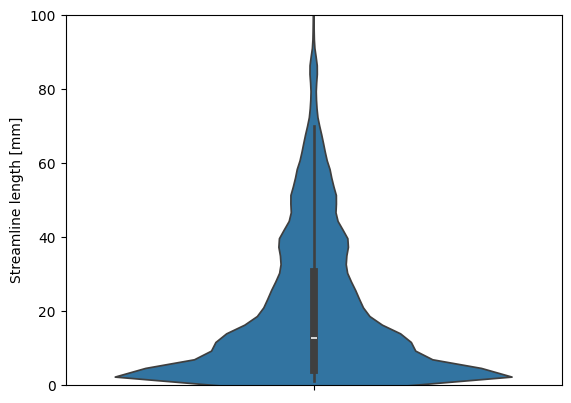

In [73]:
sns.violinplot(data=streamline_lengths)
plt.ylabel('Streamline length [mm]')
plt.ylim(0, 100)
plt.show()

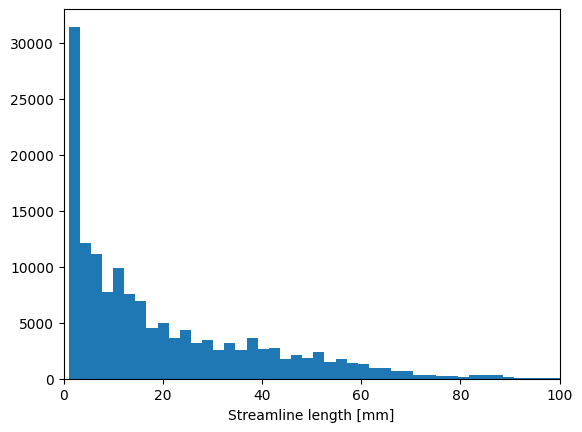

In [74]:
plt.hist(streamline_lengths, bins=100)
plt.xlabel('Streamline length [mm]')
plt.xlim(0, 100)
plt.show()

In [75]:
min_length = 40
streamlines = streamlines[streamline_lengths >= min_length]
streamlines.shape

(24187, 256, 3)

In [76]:
import plotly.graph_objects as go

fig = go.Figure()

rng = np.random.default_rng(0)

for i in range(100):
    st = (streamlines[rng.integers(len(streamlines))] - centroid) / max_xyz

    n = st.shape[0]
    x = st[:, 0]
    y = st[:, 1]
    z = st[:, 2]
    color = rng.uniform(0, 1, 3)

    fig.add_trace(go.Scatter3d(x=x, y=y, z=z, mode='lines', line=dict(color=f'rgb({color[0]*255},{color[1]*255},{color[2]*255})', width=2), opacity=0.6))

fig.update_layout(scene=dict(
                    xaxis_title='X Label',
                    yaxis_title='Y Label',
                    zaxis_title='Z Label'),
                  width=800,
                  margin=dict(r=20, b=10, l=10, t=10))

fig.show()

# NN

In [77]:
# import keras

# encoder_inputs = keras.Input(shape=(256, 3), name='encoder_inputs')
# encoder_output = keras.layers.Bidirectional(keras.layers.LSTM(64), name='encoder')(encoder_inputs)

# decoder_inputs = keras.Input(shape=(256, 3), name='decoder_inputs')
# decoder_outputs = keras.layers.LSTM(128, return_sequences=True, name='decoder')(decoder_inputs, initial_state=encoder_output)

# decoder_predictions = keras.layers.Dense(3, activation='tanh', name='head')(decoder_outputs)

# model = keras.Model([encoder_inputs, decoder_inputs], decoder_predictions)
# model.summary()

In [104]:
import keras

model = keras.Sequential([
    keras.Input(shape=(256, 3), name='encoder_inputs'),
    keras.layers.Bidirectional(keras.layers.LSTM(64), name='encoder'),
    keras.layers.RepeatVector(256, name='repeat'),
    keras.layers.LSTM(64, return_sequences=True, name='decoder'),
    keras.layers.Dense(3, activation='tanh', name='head')
])

model.summary()

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder (Bidirectional)         │ (None, 128)            │        34,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat (RepeatVector)           │ (None, 256, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder (LSTM)                  │ (None, 256, 64)        │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ head (Dense)                    │ (None, 256, 3)         │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 84,419 (329.76 KB)

 Trainable params: 84,419 (329.76 KB)

 Non-trainable params: 0 (0.00 B)

In [105]:
X_train = (streamlines - centroid) / max_xyz
y_train = X_train
X_train.shape, y_train.shape

((24187, 256, 3), (24187, 256, 3))

In [106]:
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=3e-4),
    loss='mse',
)
model.fit(X_train, y_train, epochs=1)

756/756 ━━━━━━━━━━━━━━━━━━━━ 103s 135ms/step - loss: 0.0403


In [107]:
encoder_model = keras.Model(model.get_layer('encoder').input, model.get_layer('encoder').output)

In [108]:
embeddings = encoder_model.predict(X_train)

756/756 ━━━━━━━━━━━━━━━━━━━━ 14s 18ms/step


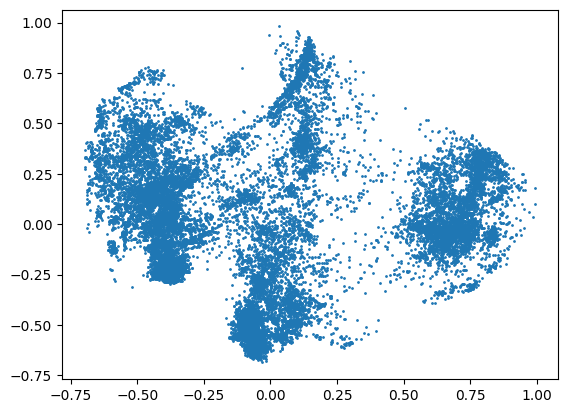

In [109]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
embeddings_2d = pca.fit_transform(embeddings)
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], s=1)
plt.show()

In [110]:
import plotly.graph_objects as go

pca = PCA(n_components=3)
embeddings_rgb = pca.fit_transform(embeddings)
# Normalize the embeddings to [0,1]
embeddings_rgb = (embeddings_rgb - embeddings_rgb.min(axis=0)) / (embeddings_rgb.max(axis=0) - embeddings_rgb.min(axis=0))
print(embeddings_rgb.min(axis=0), embeddings_rgb.max(axis=0))

fig = go.Figure()

rng = np.random.default_rng(0)

for i in range(500):
    idx = rng.integers(len(streamlines))
    st = streamlines[idx]

    n = st.shape[0]
    x = st[:, 0]
    y = st[:, 1]
    z = st[:, 2]
    color = embeddings_rgb[idx]

    fig.add_trace(go.Scatter3d(x=x, y=y, z=z, mode='lines', line=dict(color=f'rgb({color[0]*255},{color[1]*255},{color[2]*255})', width=2), opacity=0.6))

fig.update_layout(scene=dict(
                    xaxis_title='X Label',
                    yaxis_title='Y Label',
                    zaxis_title='Z Label'),
                  width=800,
                  margin=dict(r=20, b=10, l=10, t=10))

fig.show()

[0. 0. 0.] [1. 1. 1.]
